##  Problem Statement 

**Problem:** Accurately predicting loan approvals is essential for banks to ensure operational efficiency, reduce default risks, and enhance customer satisfaction. Despite access to diverse applicant data, the bank lacks a well-optimized predictive model capable of delivering highly accurate and reliable loan approval outcomes. Additionally, some loan approval decisions may be influenced by individual biases of decision-makers, leading to inconsistencies and potential unfairness.
To address this, the bank plans to utilize historical loan approval data to develop a logistic regression model. This model will predict loan approval decisions based on overall trends and key factors, reducing the influence of individual biases and ensuring fair, data-driven decision-making.

**Task:** To identify and implement the most effective predictive model, using logistic regression as a starting point, to streamline loan approval processes and improve accuracy, consistency, and fairness.

**Data Source:** https://www.kaggle.com/datasets/architsharma01/loan-approval-prediction-dataset

## Import Required Libraries


In [5]:
import pandas as pd
import numpy as np

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
sns.set()

import statsmodels.api as sm
from sklearn.model_selection import train_test_split

### Notebook Presentation

In [6]:
pd.options.display.float_format = '{:,.2f}'.format

## Load the Data


In [7]:
df = pd.read_csv('loan_approval_dataset.csv')

## Data Preprocessing


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4269 entries, 0 to 4268
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   loan_id                    4269 non-null   int64 
 1    no_of_dependents          4269 non-null   int64 
 2    education                 4269 non-null   object
 3    self_employed             4269 non-null   object
 4    income_annum              4269 non-null   int64 
 5    loan_amount               4269 non-null   int64 
 6    loan_term                 4269 non-null   int64 
 7    cibil_score               4269 non-null   int64 
 8    residential_assets_value  4269 non-null   int64 
 9    commercial_assets_value   4269 non-null   int64 
 10   luxury_assets_value       4269 non-null   int64 
 11   bank_asset_value          4269 non-null   int64 
 12   loan_status               4269 non-null   object
dtypes: int64(10), object(3)
memory usage: 433.7+ KB


In [9]:
df.head()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,1,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved
1,2,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected
2,3,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected
3,4,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected
4,5,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected


In [10]:
df.isnull().sum()

loan_id                      0
 no_of_dependents            0
 education                   0
 self_employed               0
 income_annum                0
 loan_amount                 0
 loan_term                   0
 cibil_score                 0
 residential_assets_value    0
 commercial_assets_value     0
 luxury_assets_value         0
 bank_asset_value            0
 loan_status                 0
dtype: int64

In [11]:
df.duplicated().sum()

np.int64(0)

In [12]:
df.columns

Index(['loan_id', ' no_of_dependents', ' education', ' self_employed',
       ' income_annum', ' loan_amount', ' loan_term', ' cibil_score',
       ' residential_assets_value', ' commercial_assets_value',
       ' luxury_assets_value', ' bank_asset_value', ' loan_status'],
      dtype='object')

In [13]:
# remove space in col name
df.columns = df.columns.str.replace(' ', '')

In [14]:
# create dummy variables to use in quantitative analysis
df_clean = df.copy()
df_clean.drop(labels='loan_id', axis=1)
df_clean['education'] = df_clean['education'].map({' Not Graduate': 0, ' Graduate': 1})
df_clean['self_employed'] = df_clean['self_employed'].map({' No': 0, ' Yes': 1})
df_clean['loan_status'] =df_clean['loan_status'].map({' Rejected': 0, ' Approved': 1})

In [15]:
df_clean.sample(2)

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
2617,2618,1,0,1,1400000,3300000,18,321,900000,1500000,3000000,700000,0
2740,2741,2,1,1,9400000,37300000,14,383,7800000,15900000,27100000,7700000,0


In [16]:
df_clean.loan_term.unique()

array([12,  8, 20, 10,  4,  2, 18, 16, 14,  6])

## Descriptive Statistics

In [17]:
df_clean.describe(include='all')

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
count,"4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00"
mean,"2,135.00",2.50,0.50,0.50,"5,059,123.92","15,133,450.46",10.90,599.94,"7,472,616.54","4,973,155.31","15,126,305.93","4,976,692.43",0.62
std,"1,232.50",1.70,0.50,0.50,"2,806,839.83","9,043,362.98",5.71,172.43,"6,503,636.59","4,388,966.09","9,103,753.67","3,250,185.31",0.48
min,1.00,0.00,0.00,0.00,"200,000.00","300,000.00",2.00,300.00,"-100,000.00",0.00,"300,000.00",0.00,0.00
25%,"1,068.00",1.00,0.00,0.00,"2,700,000.00","7,700,000.00",6.00,453.00,"2,200,000.00","1,300,000.00","7,500,000.00","2,300,000.00",0.00
50%,"2,135.00",3.00,1.00,1.00,"5,100,000.00","14,500,000.00",10.00,600.00,"5,600,000.00","3,700,000.00","14,600,000.00","4,600,000.00",1.00
75%,"3,202.00",4.00,1.00,1.00,"7,500,000.00","21,500,000.00",16.00,748.00,"11,300,000.00","7,600,000.00","21,700,000.00","7,100,000.00",1.00
max,"4,269.00",5.00,1.00,1.00,"9,900,000.00","39,500,000.00",20.00,900.00,"29,100,000.00","19,400,000.00","39,200,000.00","14,700,000.00",1.00


In [18]:
# identifying cases where residential_assets_value is less than 0
df_clean.loc[df_clean['residential_assets_value']< 0]['residential_assets_value'].value_counts()

residential_assets_value
-100000    28
Name: count, dtype: int64

in 28 cases we have negative residental assets value

In [19]:
df_clean.loc[df_clean['residential_assets_value']< 0]

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
59,60,4,0,1,5500000,18200000,16,797,-100000,4900000,18600000,4800000,1
196,197,4,0,1,400000,1500000,2,669,-100000,600000,900000,500000,1
559,560,2,1,1,200000,500000,6,885,-100000,0,300000,200000,0
702,703,4,1,1,6300000,23900000,6,899,-100000,11400000,20600000,6700000,1
737,738,2,1,1,900000,2500000,16,458,-100000,100000,3200000,1100000,0
784,785,0,1,0,5000000,14400000,2,761,-100000,7300000,12600000,4500000,1
904,905,2,1,0,4100000,14900000,12,571,-100000,5200000,13000000,3400000,1
1089,1090,3,1,0,5100000,11000000,6,336,-100000,5800000,11600000,7500000,0
1163,1164,2,1,0,4500000,9100000,18,593,-100000,600000,12400000,2500000,1
1350,1351,5,1,0,4000000,13700000,6,496,-100000,1400000,15800000,3700000,0


According to chatGPT that situation could be explained by Mortgage or Debt Situations: In cases of foreclosure or negative equity (where the outstanding mortgage is higher than the current value of the property), the equity in the property might be negative. But this wouldn't typically apply to the asset value, which usually reflects the market price of the property itself, not its equity.


I can assume that if a mortgage situation were indicated, the dataset would reflect different amounts for mortgage loans or payments. For now, let's assume that in these 28 cases, the negative values are due to data entry errors, and it's most likely that the value should be 0.

In [20]:
# value -100000 for resodential assets looks strange, probably it means 0
df_clean.loc[df_clean['residential_assets_value']< 0, 'residential_assets_value'] = 0

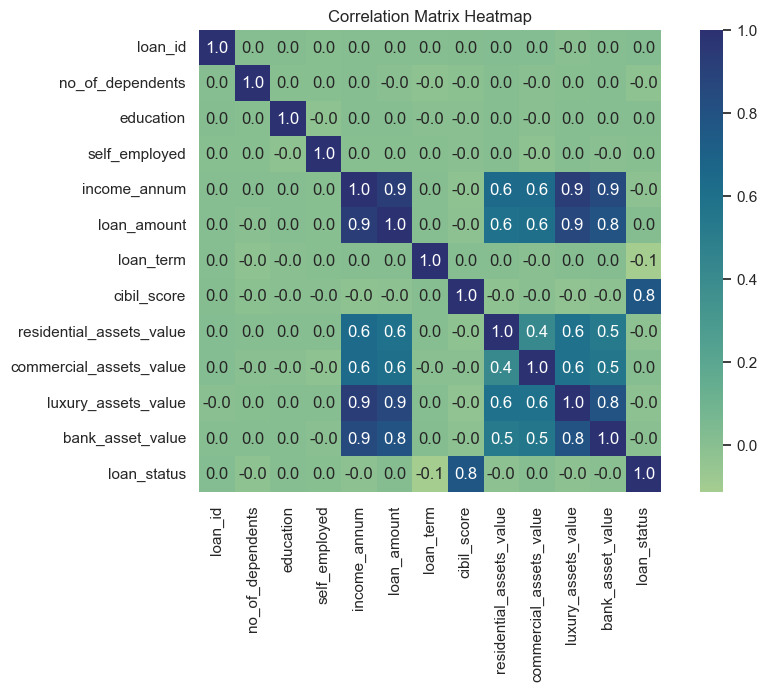

In [21]:
plt.figure(figsize=(10, 6))
correlation_matrix = df_clean.corr()
sns.heatmap(correlation_matrix, cmap="crest", annot=True, fmt=".1f", square=True)
plt.title('Correlation Matrix Heatmap')
plt.show()

Potential Multicollinearity:
- luxury_assets_value correlates highly with residential_assets_value(0.6) and commercial_assets_value(0.6) and bank_assets_value(0.8).
This could indicate overlapping or redundant information, leading to multicollinearity issues in modeling.
- Similarly, income_annum and loan_amount are highly correlated with all asset-related variables, which could also impact model performance

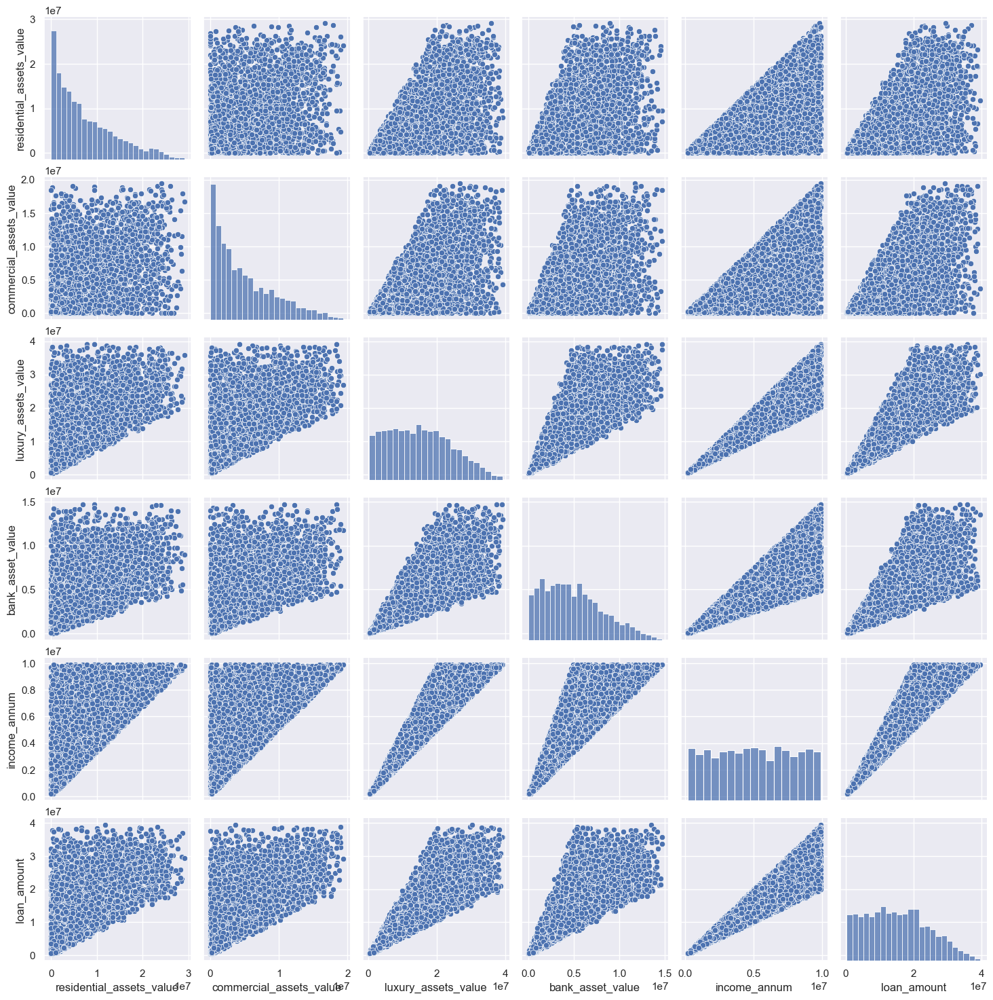

In [22]:
sns.pairplot(df_clean[['residential_assets_value',  'commercial_assets_value', 'luxury_assets_value', 'bank_asset_value', 'income_annum', 'loan_amount']])
plt.show()

**The analysis reveals strong positive correlations, particularly between income_annum and loan_amount, as well as between income_annum and bank_assets_value. However, some feature pairs, such as loan_amount and residential_assets_value, show no clear relationship. Asset-related features, including residential_assets_value, commercial_assets_value, and luxury_assets_value, exhibit overlapping information, which indicates multicollinearity.**

The triangular shapes in the scatter plots represent bounded relationships between variables, commonly observed in financial datasets. These arise due to:
- Feature Dependencies: Variables like income_annum and loan_amount are interdependent, with higher income enabling larger loans, but not all high-income individuals take large loans, creating a triangle pattern.
- Logical Constraints: Real-world limits, such as a person with low income not owning luxury assets, or banks capping loan amounts based on income or assets, contribute to these patterns.
- Regulatory or Policy Factors: Financial policies, such as debt-to-income ratios or creditworthiness requirements, often restrict variable ranges, reinforcing these bounded relationships.
- Data Sampling Bias: The dataset may predominantly represent certain groups (e.g., middle-income earners), which could lead to triangular correlations.

To address multicollinearity issues, I will combine the asset-related features into a single composite feature called all_assets_value. Additionally, 

I will create new derived variables to provide additional insights and potentially reduce multicollinearity:

- income_per_person: This feature represents annual income divided by the number of dependents (plus one to avoid division by zero).
- debt_income_ratio: This is the ratio of the loan amount to annual income, capturing financial leverage.
- debt_assets_ratio: This is the ratio of the loan amount to total assets, reflecting asset-backed debt.
  
These adjustments will help simplify the relationships between variables, reduce multicollinearity, and improve the stability and performance of the model.

In [23]:
# let's add additional variables which can potentially decrease multicollinearity
df_clean['all_assets'] = df_clean['residential_assets_value'] + df_clean['commercial_assets_value'] + df_clean['bank_asset_value'] + df_clean['luxury_assets_value']
df_clean['income_per_person'] = df_clean['income_annum'] / (df_clean['no_of_dependents']+1)
df_clean['debt_income_ratio'] = df_clean['loan_amount'] / df_clean['income_annum']
df_clean['debt_assets_ratio'] = df_clean['loan_amount'] / df_clean['all_assets']

In [24]:
df_clean.columns


Index(['loan_id', 'no_of_dependents', 'education', 'self_employed',
       'income_annum', 'loan_amount', 'loan_term', 'cibil_score',
       'residential_assets_value', 'commercial_assets_value',
       'luxury_assets_value', 'bank_asset_value', 'loan_status', 'all_assets',
       'income_per_person', 'debt_income_ratio', 'debt_assets_ratio'],
      dtype='object')

In [25]:
df_clean = df_clean[['no_of_dependents', 'education', 'self_employed', 'income_annum',
       'loan_amount', 'loan_term', 'cibil_score', 'residential_assets_value',
       'commercial_assets_value', 'luxury_assets_value', 'bank_asset_value',
       'all_assets', 'income_per_person', 'debt_income_ratio',
       'debt_assets_ratio', 'loan_status']]

In [26]:
df_clean.describe()

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,all_assets,income_per_person,debt_income_ratio,debt_assets_ratio,loan_status
count,"4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00","4,269.00"
mean,2.50,0.50,0.50,"5,059,123.92","15,133,450.46",10.90,599.94,"7,473,272.43","4,973,155.31","15,126,305.93","4,976,692.43","32,549,426.10","2,055,049.97",2.98,0.49,0.62
std,1.70,0.50,0.50,"2,806,839.83","9,043,362.98",5.71,172.43,"6,502,877.68","4,388,966.09","9,103,753.67","3,250,185.31","19,505,944.78","2,003,232.65",0.60,0.14,0.48
min,0.00,0.00,0.00,"200,000.00","300,000.00",2.00,300.00,0.00,0.00,"300,000.00",0.00,"500,000.00","33,333.33",1.50,0.18,0.00
25%,1.00,0.00,0.00,"2,700,000.00","7,700,000.00",6.00,453.00,"2,200,000.00","1,300,000.00","7,500,000.00","2,300,000.00","16,300,000.00","775,000.00",2.46,0.38,0.00
50%,3.00,1.00,1.00,"5,100,000.00","14,500,000.00",10.00,600.00,"5,600,000.00","3,700,000.00","14,600,000.00","4,600,000.00","31,500,000.00","1,450,000.00",3.00,0.47,1.00
75%,4.00,1.00,1.00,"7,500,000.00","21,500,000.00",16.00,748.00,"11,300,000.00","7,600,000.00","21,700,000.00","7,100,000.00","47,200,000.00","2,500,000.00",3.50,0.57,1.00
max,5.00,1.00,1.00,"9,900,000.00","39,500,000.00",20.00,900.00,"29,100,000.00","19,400,000.00","39,200,000.00","14,700,000.00","90,700,000.00","9,900,000.00",4.00,1.33,1.00


There is a large variability in income, loan amounts, and asset values, showing a diverse applicant pool

- No of Dependents: The average number of dependents is 2.5, with values ranging from 0 to 5. The spread is relatively wide, as indicated by the standard deviation of 1.7.

- Education: This variable is binary, with 50% of the individuals having complete education

- Self-Employed: This variable is also binary, with 50% of individuals being self-employed. Similar to the education variable, the distribution shows equal split.

- Income (Income Annum): The mean annual income is approximately 5 million, with a high standard deviation of 2.8 million. The range of income spans from 200,000 to nearly 10 million, showing significant variability in income levels.

- Loan Amount: The average loan amount is approximately 15.1 million, with a considerable spread of up to 39.5 million. This variable has a large standard deviation of 9.04 million, indicating diversity in loan amounts.

- Loan Term: The average loan term is 10.9 years, with a minimum of 2 years and a maximum of 20 years. The distribution is fairly concentrated around the mean, with standard deviation of 5.71 years.

- Cibil Score: The average Cibil score is 599.94, with a range of 300 to 900, indicating a significant variation in the creditworthiness of applicants.

- All Assets: The average value of assets is about 32.5 million, with a high degree of variability (standard deviation of 19.5 million). The range spans from 500,000 to 90.7 million, indicating a diverse set of asset values.

- Income per Person: The average income per person is 2.05 million, with the minimum income per person recorded at 33,333.33. The standard deviation is relatively large at 2 million, showing high variability in this measure.

- Debt-to-Income Ratio: The average debt-to-income ratio is 0.49, with a range between 0.18 and 1.33. This suggests a significant variation in how much debt applicants carry relative to their income.

- Debt-to-Assets Ratio: The mean debt-to-assets ratio is 0.62, with most applicants having a value between 0 and 1. The standard deviation of 0.48 indicates some degree of diversity in financial leverage.

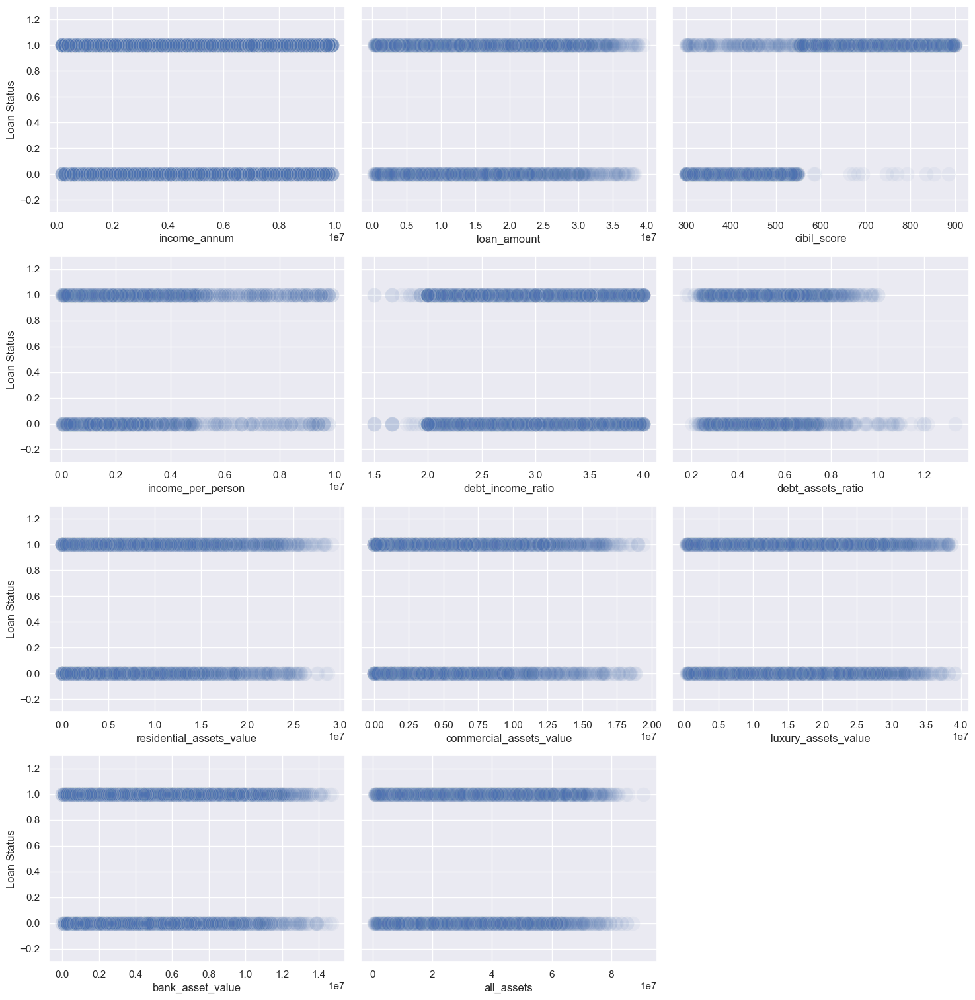

In [27]:
df_plot = df_clean[['income_annum', 'loan_amount', 'cibil_score', 'income_per_person', 'debt_income_ratio', 'debt_assets_ratio',
                    'residential_assets_value',  'commercial_assets_value', 'luxury_assets_value', 'bank_asset_value', 'all_assets', 'loan_status']]

num_cols = 3
num_rows = int(np.ceil((len(df_plot.columns)) - 1 / num_cols))

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 45), sharey=True)

# Flatten the axes to a 1D array for easier indexing
axes = axes.flatten()

# Plot each column
for i, col in enumerate(df_plot.columns):
    if col != 'loan_status':
        sns.scatterplot(data=df_plot, x=col, y='loan_status', alpha=0.05, s=250, ax=axes[i])
        axes[i].set_ylabel('Loan Status')
        axes[i].set_xlabel(col)
        axes[i].set_ylim(-0.3, 1.3)
        axes[i].legend([], [], frameon=False)

# Remove any empty subplots
for i in range(len(df_plot.columns) - 1, num_rows * num_cols):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

The cibil_score appears to have a strong non-linear relationship with Loan Status. As the cibil_score increases, Loan Status shifts from negative to positive.

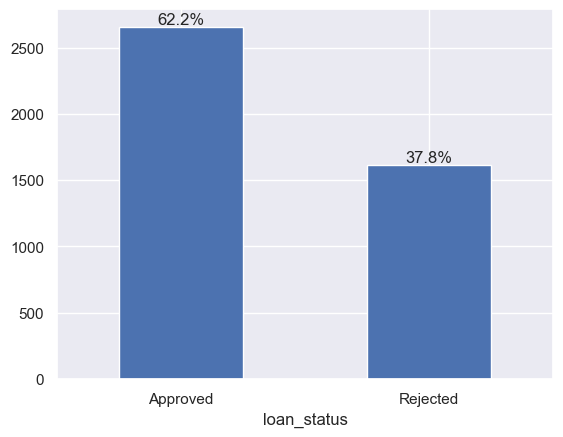

In [28]:
ax = df_clean.loan_status.value_counts().plot(kind='bar')
ax.set_xticklabels(['Approved', 'Rejected'], rotation=0)
for p in ax.patches:
    ax.annotate(f'{p.get_height()/len(df_clean)*100:.1f}%', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.show()

The distribution of 62,2% approved loans and 37,8% rejected loans suggests a slight imbalance, but it is not extremely severe. Typically, a dataset is considered imbalanced when one class (e.g., approved or rejected loans) significantly outnumbers the other, with a common threshold being a ratio of 70-30 or higher

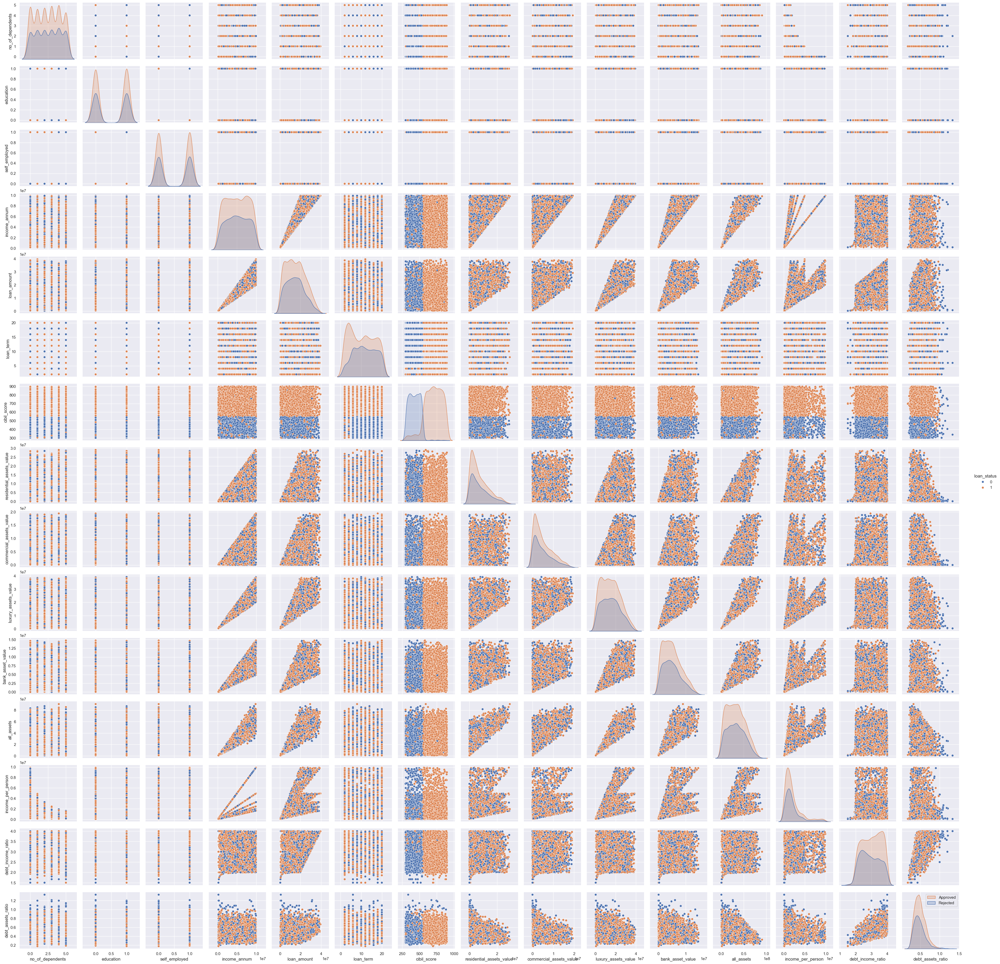

In [29]:
sns.pairplot(df_clean, hue='loan_status')
plt.legend(['Approved', 'Rejected'])
plt.show()

In these graphs, we observe a relatively balanced distribution of accepted and rejected loan applications across most categories, except for cibil_score, where the distribution shows a clear distinction.

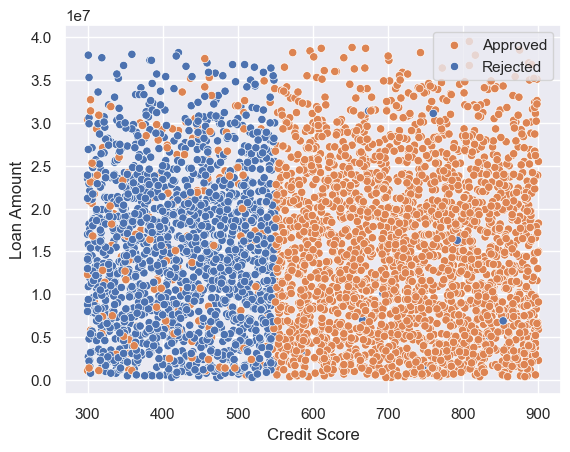

In [30]:
sns.scatterplot(x=df_clean['cibil_score'], y= df_clean['loan_amount'], hue=df_clean['loan_status'])
plt.title("")
plt.xlabel("Credit Score")
plt.ylabel("Loan Amount")
plt.legend(['Approved', 'Rejected'])
plt.show()

It is noteworthy that credit scores in the range of 540–550 create a distinct separation in loan status, highlighting a strong relationship between credit score and loan approval outcomes. Interestingly, this threshold is lower than 579, the upper boundary of the "poor" credit score category. This indicates that applicants with credit scores above 540–550, despite being classified as "poor," still have a significant likelihood of loan approval. This may reflect the flexibility of lenders or other factors influencing their decisions.

However, an intriguing trend is also observed: some applicants with high credit scores (above 740) were rejected. Notably, a subset of these individuals applied for loan amounts below the median value. This raises questions about the underlying factors contributing to these unexpected rejections.

In [31]:
df_clean.to_csv('loan_preprocessed.csv')